## 2. General Clustering Algorithms Applied to Neural Embeddings


This walks through the application of baseline clustering on the (PCA reduced) neural embedding space. A couple of things to note:
- testing AST, CLAP and WAVLM embeddings.
- these have varying dimensionality. We reduce via PCA to 30 dimensions, to ensure a somewhat fair comparison and for consitency with the CTMs.

The main driver code for most of the functionality in this notebook can be found in `scripts/embeddings_general.py`. 

In [1]:
import os
os.chdir('..')

### Loading the Dataset

In [2]:
from utils.load import load_embeddings_dataset

embeddings_df = load_embeddings_dataset("data/videogame_embeddings/embedding_dataset.parquet")
embeddings_df.head()

,filename,ast,wavlm,clap,id,name,rating,themes,keywords,involved_companies,first_release_year,metadata
0,Luke_s_Theme_(Arranged).wav,"[1.374433, 1.0695944, 0.04797495, -0.42208233,...","[-0.00248229, 0.05962407, -0.0011553991, 0.103...","[0.0063681714, -0.37322238, -0.30396485, -0.83...",4181,Star Wars: Rogue Squadron II - Rogue Leader,85.4,"[""Action"", ""Science fiction""]","[""space simulation"", ""space combat"", ""robots"",...","[""Activision"", ""Factor 5"", ""LucasArts""]",2001,star wars rogue squadron ii rogue leader actio...
1,Death_Star_Attack.wav,"[1.2433861, -0.14838827, -0.33959186, 0.145193...","[-0.008416168, 0.018923571, -0.070149176, 0.05...","[0.3747486, -0.0049350746, -0.8977523, -0.8723...",4181,Star Wars: Rogue Squadron II - Rogue Leader,85.4,"[""Action"", ""Science fiction""]","[""space simulation"", ""space combat"", ""robots"",...","[""Activision"", ""Factor 5"", ""LucasArts""]",2001,star wars rogue squadron ii rogue leader actio...
2,Battle_for_Storm_Hill.wav,"[1.1444644, 0.13062434, -0.4718857, 0.09288005...","[-0.008840599, -0.006281961, -0.058815807, 0.0...","[0.57902086, 0.007904012, -0.15739492, -0.1549...",1097,Donkey Kong Jungle Beat,67.7,"[""Action""]","[""combat"", ""pig"", ""panda"", ""underwater gamepla...","[""Nintendo EAD Tokyo Software Development Grou...",2004,donkey kong jungle beat action combat pig pand...
3,Aerie_Fortress.wav,"[0.9122599, 0.2314296, -0.008622774, 0.2431591...","[0.070501156, 6.1879415e-05, -0.021063795, 0.0...","[1.045783, -0.017928796, 0.08965086, -1.298964...",1097,Donkey Kong Jungle Beat,67.7,"[""Action""]","[""combat"", ""pig"", ""panda"", ""underwater gamepla...","[""Nintendo EAD Tokyo Software Development Grou...",2004,donkey kong jungle beat action combat pig pand...
4,Stage_2-2.wav,"[0.9520262, 0.1271173, 0.061484247, -0.1729279...","[0.031276666, -0.008869544, -0.04219547, 0.026...","[0.10054495, -1.270201, 0.6900546, -0.41986156...",341259,Viewtiful Joe,0,"[""Action""]",[],"[""Clover Studio"", ""Capcom""]",2004,viewtiful joe action clover studio capcom


Just as with the CTMs, we apply PCA

In [3]:
from scripts.embeddings_general import preprocess_embeddings

# example: CLAP
clap_embeddings = preprocess_embeddings(embeddings_df, model_name='clap', remove_outliers=True, n_components=30)

2025-12-04 01:34:59.249 | INFO     | scripts.embeddings_general:preprocess_embeddings:97 - PCA on clap embeddings, original dim=1024
2025-12-04 01:35:00.538 | INFO     | scripts.embeddings_general:preprocess_embeddings:106 - clap: PCA -> 42 dims (≥90% variance)
2025-12-04 01:35:00.538 | INFO     | scripts.embeddings_general:preprocess_embeddings:110 - clap: PCA limited to 30 dims (n_components=30)
2025-12-04 01:35:00.622 | INFO     | scripts.embeddings_general:preprocess_embeddings:120 - Removed 227 outliers (Mahalanobis, χ² threshold=50.89)


### Tune K 

In [4]:
from scripts.embeddings_general import tune_embedding_clusters

model = 'clap'
silhouette_scores, davies_bouldin_scores = tune_embedding_clusters(
    embeddings_df,
    model_name=model,
    k_list=list(range(2, 21)),
    n_components=30,
    save=False
)
print("Silhouette Scores:", silhouette_scores)
print("Davies-Bouldin Scores:", davies_bouldin_scores)

2025-12-04 01:35:00.644 | INFO     | scripts.embeddings_general:tune_embedding_clusters:152 - Tuning clustering for clap embeddings with n_components=30…
2025-12-04 01:35:00.644 | INFO     | scripts.embeddings_general:tune_embedding_clusters:153 - Preprocessing embeddings for tuning (clap)…
2025-12-04 01:35:00.654 | INFO     | scripts.embeddings_general:preprocess_embeddings:97 - PCA on clap embeddings, original dim=1024
2025-12-04 01:35:01.972 | INFO     | scripts.embeddings_general:preprocess_embeddings:106 - clap: PCA -> 42 dims (≥90% variance)
2025-12-04 01:35:01.972 | INFO     | scripts.embeddings_general:preprocess_embeddings:110 - clap: PCA limited to 30 dims (n_components=30)
2025-12-04 01:35:02.071 | INFO     | scripts.embeddings_general:preprocess_embeddings:120 - Removed 227 outliers (Mahalanobis, χ² threshold=50.89)
[clap] KMeans tuning: 100%|██████████| 19/19 [00:08<00:00,  2.24it/s]

Silhouette Scores: {'kmeans': {2: 0.12014732509851456, 3: 0.12367057055234909, 4: 0.1145201176404953, 5: 0.10830886662006378, 6: 0.09659240394830704, 7: 0.09944169223308563, 8: 0.0970539003610611, 9: 0.10497356206178665, 10: 0.10390479862689972, 11: 0.10135991126298904, 12: 0.1020403802394867, 13: 0.10144347697496414, 14: 0.0979355201125145, 15: 0.09993823617696762, 16: 0.09745632112026215, 17: 0.0962870791554451, 18: 0.09559989720582962, 19: 0.09596100449562073, 20: 0.09793498367071152}}
Davies-Bouldin Scores: {'kmeans': {2: 2.6006599308442615, 3: 2.438858963807492, 4: 2.532024480328952, 5: 2.3933466863742594, 6: 2.528983026153901, 7: 2.4259661504071235, 8: 2.395701074376989, 9: 2.265916368636331, 10: 2.230579809246209, 11: 2.3201539241741176, 12: 2.294295348523947, 13: 2.290074112167314, 14: 2.3121646540011644, 15: 2.285141055906515, 16: 2.339578270234499, 17: 2.2836859519580703, 18: 2.283630658027863, 19: 2.2732183838698266, 20: 2.2324633852524247}}


We refer to the plot shown in the report for a more in depth analysis of the silhoutte scores. For consistency and demonstration convenience we proceed with $k=6$.

### 2D, 3D visualisation of clusters

In [5]:
k=6

2025-12-04 01:38:03.773 | INFO     | scripts.embeddings_general:preprocess_embeddings:97 - PCA on clap embeddings, original dim=1024


2025-12-04 01:38:05.416 | INFO     | scripts.embeddings_general:preprocess_embeddings:106 - clap: PCA -> 42 dims (≥90% variance)
2025-12-04 01:38:05.416 | INFO     | scripts.embeddings_general:preprocess_embeddings:110 - clap: PCA limited to 30 dims (n_components=30)
2025-12-04 01:38:05.510 | INFO     | scripts.embeddings_general:preprocess_embeddings:120 - Removed 227 outliers (Mahalanobis, χ² threshold=50.89)
2025-12-04 01:38:06.372 | INFO     | scripts.embeddings_general:preprocess_embeddings:97 - PCA on ast embeddings, original dim=1536
2025-12-04 01:38:09.280 | INFO     | scripts.embeddings_general:preprocess_embeddings:106 - ast: PCA -> 408 dims (≥90% variance)
2025-12-04 01:38:09.280 | INFO     | scripts.embeddings_general:preprocess_embeddings:110 - ast: PCA limited to 30 dims (n_components=30)
2025-12-04 01:38:09.433 | INFO     | scripts.embeddings_general:preprocess_embeddings:120 - Removed 172 outliers (Mahalanobis, χ² threshold=50.89)
2025-12-04 01:38:10.330 | INFO     | sc

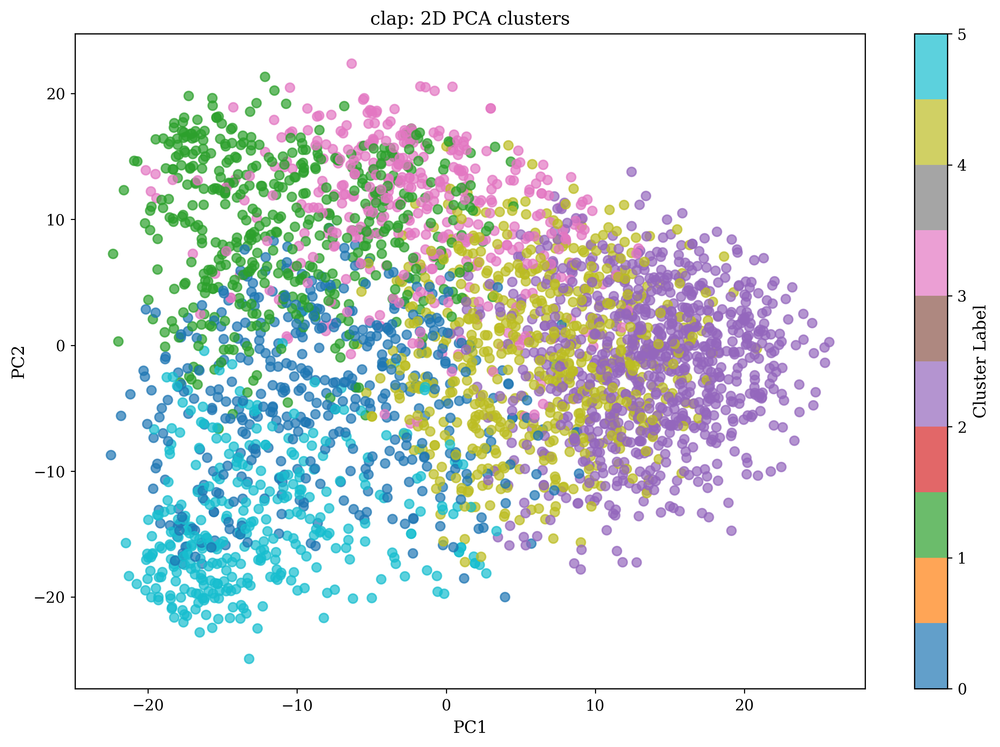

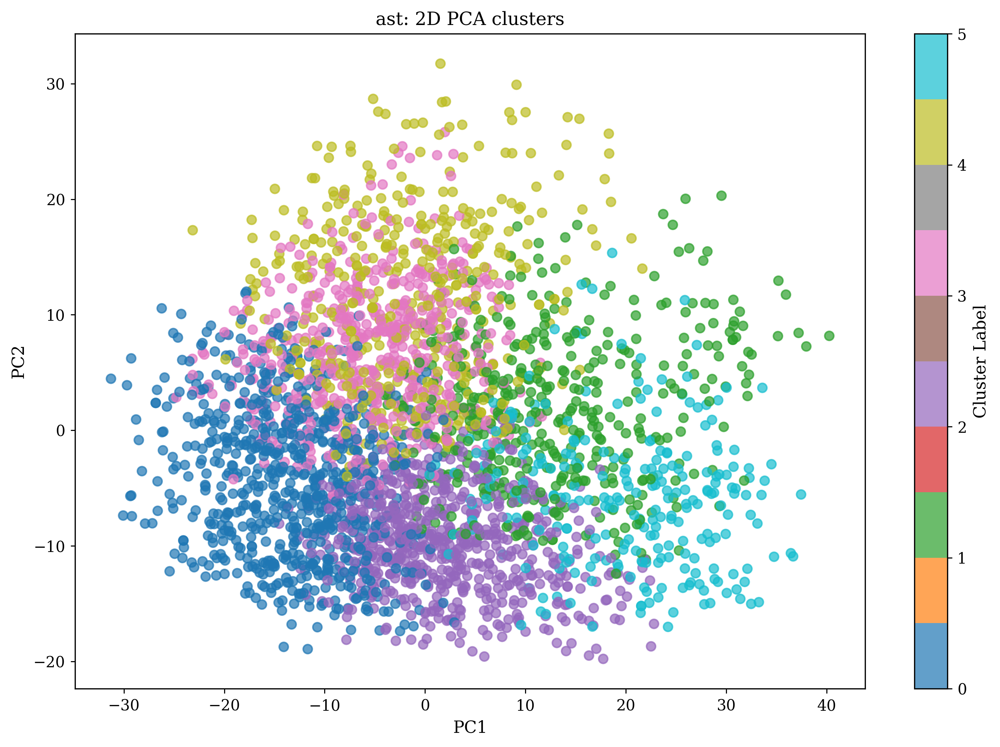

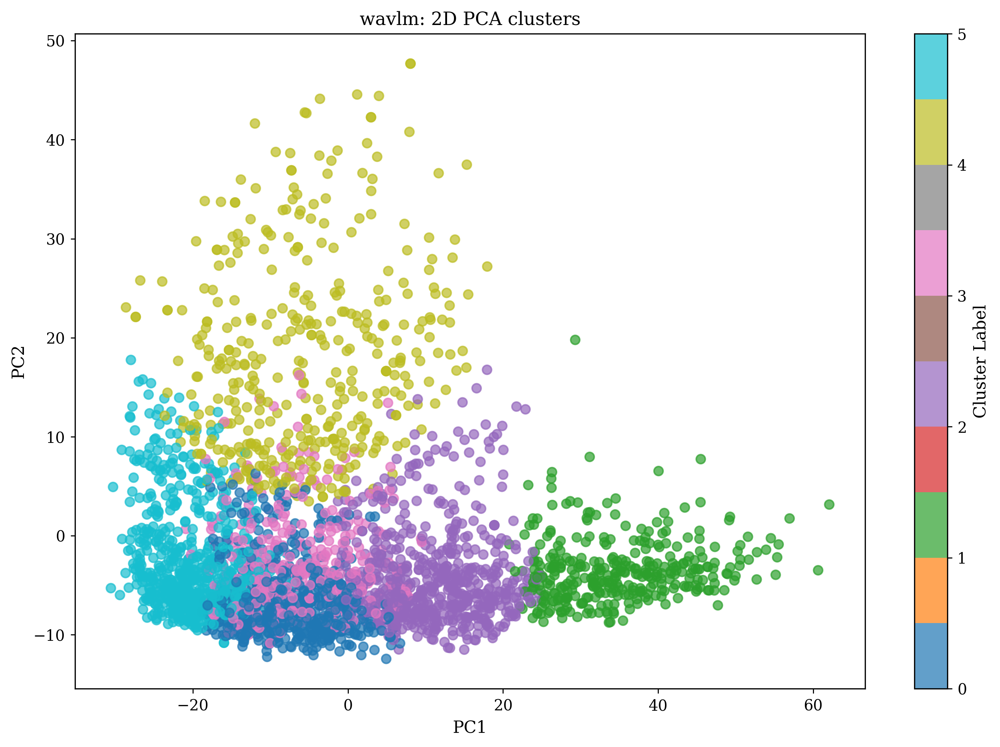

In [10]:
from scripts.embeddings_general import plot_embedding_clusters

from sklearn.cluster import KMeans

model = KMeans(n_clusters=k, random_state=42)

_ = plot_embedding_clusters(
    embeddings_df,
    model_name='clap',
    model=model,
    n_components=30,
    remove_outliers=True,
    save=False,
    dim=2
)
_ = plot_embedding_clusters(
    embeddings_df,
    model_name='ast',
    model=model,
    n_components=30,
    remove_outliers=True,
    save=False,
    dim=2
)
_ = plot_embedding_clusters(
    embeddings_df,
    model_name='wavlm',
    model=model,
    n_components=30,
    remove_outliers=True,
    save=False,
    dim=2
)

2025-12-04 02:04:28.840 | INFO     | scripts.embeddings_general:preprocess_embeddings:97 - PCA on clap embeddings, original dim=1024


2025-12-04 02:04:30.394 | INFO     | scripts.embeddings_general:preprocess_embeddings:106 - clap: PCA -> 42 dims (≥90% variance)
2025-12-04 02:04:30.397 | INFO     | scripts.embeddings_general:preprocess_embeddings:110 - clap: PCA limited to 30 dims (n_components=30)
2025-12-04 02:04:30.502 | INFO     | scripts.embeddings_general:preprocess_embeddings:120 - Removed 227 outliers (Mahalanobis, χ² threshold=50.89)


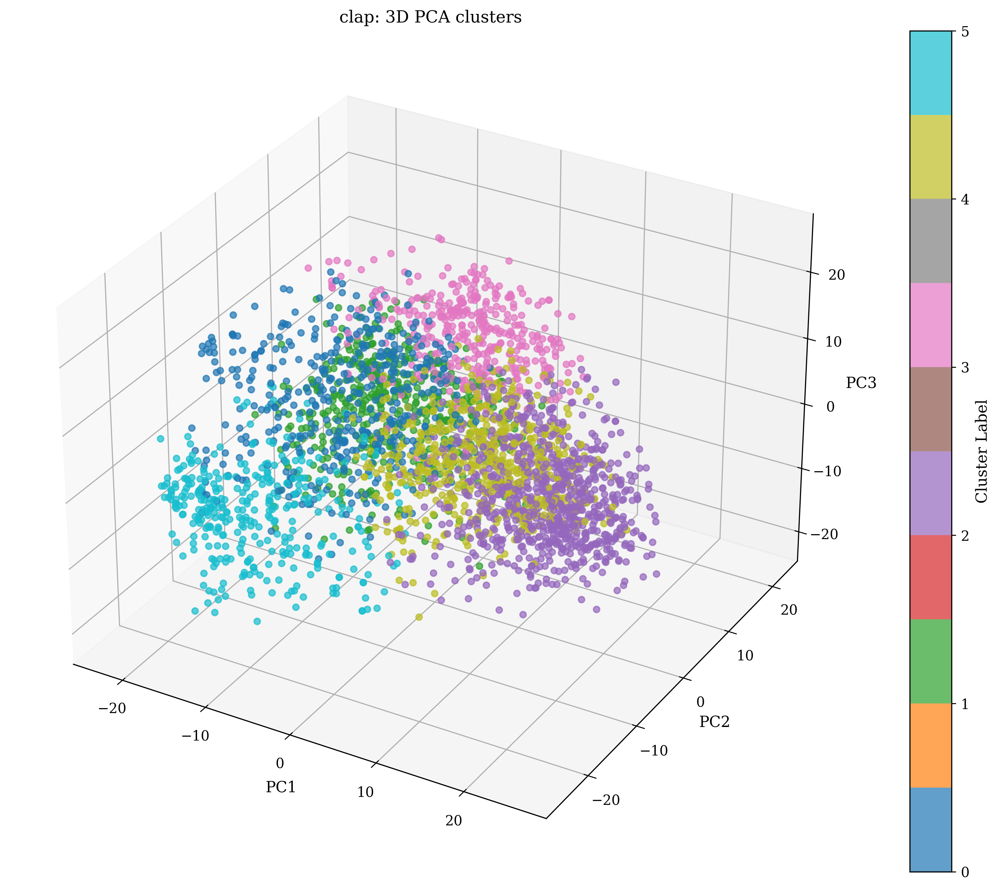

2025-12-04 02:04:31.502 | INFO     | scripts.embeddings_general:preprocess_embeddings:97 - PCA on ast embeddings, original dim=1536
2025-12-04 02:04:34.526 | INFO     | scripts.embeddings_general:preprocess_embeddings:106 - ast: PCA -> 408 dims (≥90% variance)
2025-12-04 02:04:34.526 | INFO     | scripts.embeddings_general:preprocess_embeddings:110 - ast: PCA limited to 30 dims (n_components=30)
2025-12-04 02:04:34.643 | INFO     | scripts.embeddings_general:preprocess_embeddings:120 - Removed 176 outliers (Mahalanobis, χ² threshold=50.89)


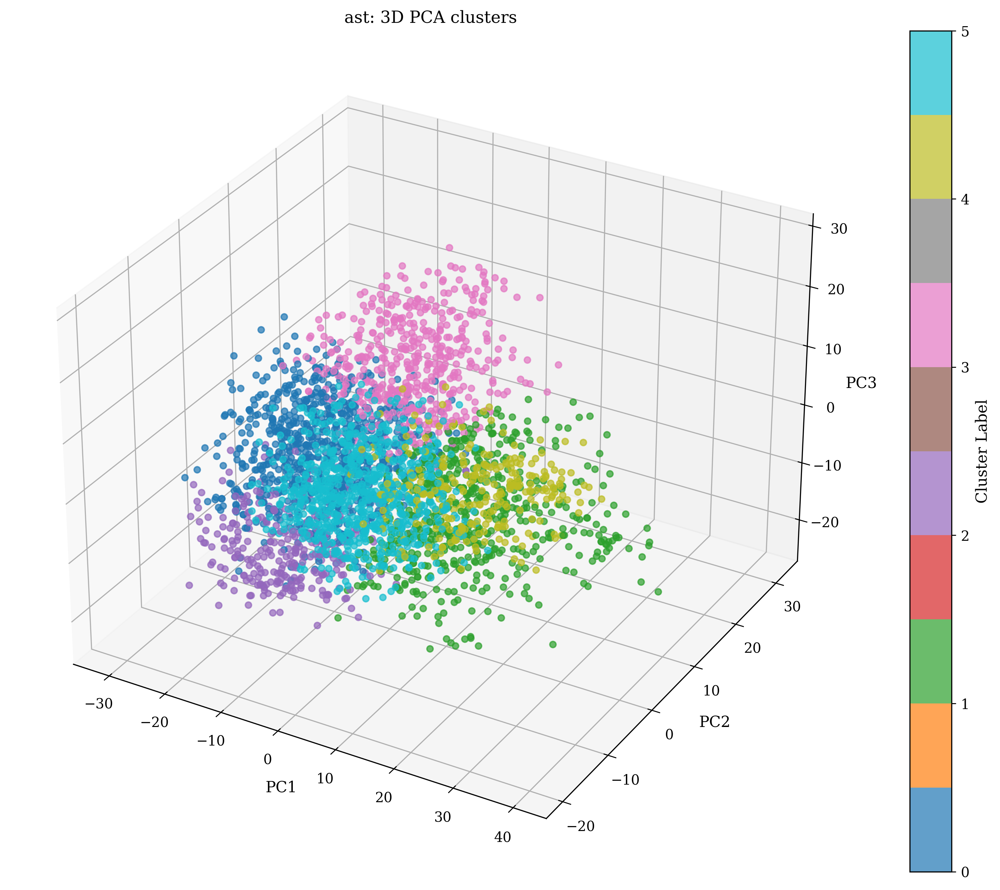

2025-12-04 02:04:35.493 | INFO     | scripts.embeddings_general:preprocess_embeddings:97 - PCA on wavlm embeddings, original dim=1536
2025-12-04 02:04:38.279 | INFO     | scripts.embeddings_general:preprocess_embeddings:106 - wavlm: PCA -> 243 dims (≥90% variance)
2025-12-04 02:04:38.281 | INFO     | scripts.embeddings_general:preprocess_embeddings:110 - wavlm: PCA limited to 30 dims (n_components=30)
2025-12-04 02:04:38.426 | INFO     | scripts.embeddings_general:preprocess_embeddings:120 - Removed 286 outliers (Mahalanobis, χ² threshold=50.89)


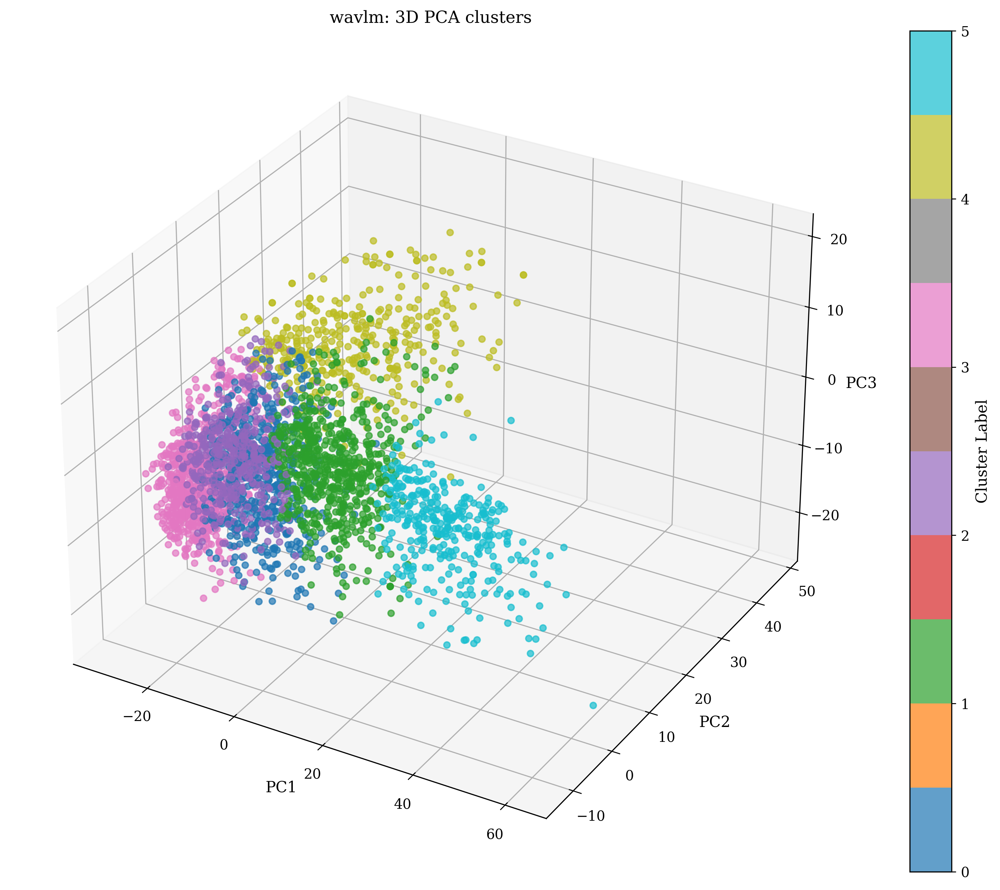

In [12]:
clap_df = plot_embedding_clusters(
    embeddings_df,
    model_name='clap',
    n_components=30,
    model=model,
    remove_outliers=True,
    save=False,
    dim=3
)
_ = plot_embedding_clusters(
    embeddings_df,
    model_name='ast',
    n_components=30,
    model=model,
    remove_outliers=True,
    save=False,
    dim=3
)
_ = plot_embedding_clusters(
    embeddings_df,
    model_name='wavlm',
    n_components=30,
    model=model,
    remove_outliers=True,
    save=False,
    dim=3
)


### External Validation

Let's test CLAP

In [13]:
clap_df.head(2)

,filename,ast,wavlm,clap,id,name,rating,themes,keywords,involved_companies,first_release_year,metadata,cluster_label
0,Luke_s_Theme_(Arranged).wav,"[1.374433, 1.0695944, 0.04797495, -0.42208233,...","[-0.00248229, 0.05962407, -0.0011553991, 0.103...","[0.0063681714, -0.37322238, -0.30396485, -0.83...",4181,Star Wars: Rogue Squadron II - Rogue Leader,85.4,"[""Action"", ""Science fiction""]","[""space simulation"", ""space combat"", ""robots"",...","[""Activision"", ""Factor 5"", ""LucasArts""]",2001,star wars rogue squadron ii rogue leader actio...,1
1,Death_Star_Attack.wav,"[1.2433861, -0.14838827, -0.33959186, 0.145193...","[-0.008416168, 0.018923571, -0.070149176, 0.05...","[0.3747486, -0.0049350746, -0.8977523, -0.8723...",4181,Star Wars: Rogue Squadron II - Rogue Leader,85.4,"[""Action"", ""Science fiction""]","[""space simulation"", ""space combat"", ""robots"",...","[""Activision"", ""Factor 5"", ""LucasArts""]",2001,star wars rogue squadron ii rogue leader actio...,3


We have cluster labels...

In [14]:
from utils.tf_idf import tfidf_cluster_summary

tf_idf = tfidf_cluster_summary(
    clap_df
)
tf_idf

{1: ['zelda',
  'legend',
  'legend zelda',
  'imagica digitalscape',
  'fantasy zelda',
  'nintendo imagica',
  'imagica',
  'digitalscape',
  'twilight princess',
  'zelda motion',
  'zelda twilight',
  'twilight',
  'princess action',
  'development',
  'control nintendo',
  'fantasy',
  'ead software',
  'group nintendo',
  'development group',
  'software development'],
 3: ['super',
  'nintendo',
  'game console',
  'gamecube retroachievements',
  'pok',
  'platform fighting',
  'legendary pok',
  'pok mon',
  'mon',
  'smash bros',
  'super smash',
  'pikachu',
  'fighting legendary',
  'smash',
  'animation canceling',
  'canceling',
  'legendary',
  'bros melee',
  'canceling game',
  'retroachievements player'],
 2: ['sonic',
  'mega',
  'mega man',
  'man',
  'sega',
  'sonic team',
  'digital',
  'team',
  'robot',
  'playstation',
  'distribution',
  'digital distribution',
  'sonic adventure',
  'high',
  'art',
  'score',
  'high score',
  'boss',
  'sega sonic',
  'titl

In [15]:
from utils.metrics import column_wise_summary

column_metrics = column_wise_summary(
    clap_df,
    columns = ["name", "themes", "keywords", "involved_companies", "first_release_year"]
)

2025-12-04 02:06:28.092 | DEBUG    | utils.metrics:column_wise_summary:234 - Processing cluster 0, column 'name'…
2025-12-04 02:06:28.102 | DEBUG    | utils.metrics:column_wise_summary:234 - Processing cluster 0, column 'themes'…
2025-12-04 02:06:28.108 | DEBUG    | utils.metrics:column_wise_summary:234 - Processing cluster 0, column 'keywords'…
2025-12-04 02:06:28.164 | DEBUG    | utils.metrics:column_wise_summary:234 - Processing cluster 0, column 'involved_companies'…
2025-12-04 02:06:28.175 | DEBUG    | utils.metrics:column_wise_summary:234 - Processing cluster 0, column 'first_release_year'…
2025-12-04 02:06:28.180 | DEBUG    | utils.metrics:column_wise_summary:234 - Processing cluster 1, column 'name'…
2025-12-04 02:06:28.193 | DEBUG    | utils.metrics:column_wise_summary:234 - Processing cluster 1, column 'themes'…
2025-12-04 02:06:28.201 | DEBUG    | utils.metrics:column_wise_summary:234 - Processing cluster 1, column 'keywords'…
2025-12-04 02:06:28.226 | DEBUG    | utils.metri

In [16]:
column_metrics

{'0': {'name': {'counts': {'The Legend of Zelda: Twilight Princess': 48,
    'The Legend of Zelda: The Wind Waker': 24,
    'Mario & Luigi: Partners in Time': 20,
    'Tales of Symphonia': 14,
    'Kingdom Hearts': 14,
    'Animal Crossing': 13,
    'Final Fantasy X': 12,
    'Dark Cloud 2': 8,
    "Blue's Journey": 8,
    'Star Fox Adventures': 7,
    'Paper Mario: The Thousand-Year Door': 7,
    'The Legend of Zelda: Phantom Hourglass': 7,
    'Animal Crossing: Wild World': 7,
    'Final Fantasy III': 7,
    'Super Mario Galaxy': 7,
    'Dark Cloud': 7,
    'New Super Mario Bros.': 6,
    'Final Fantasy XII': 6,
    'Ōkami': 6,
    'Shenmue II': 6,
    'Super Smash Bros. Melee': 5,
    'Metroid Prime': 5,
    "Mario & Luigi: Bowser's Inside Story": 5,
    "Yoshi's Island DS": 5,
    'Animal Crossing: City Folk': 5,
    'Super Mario Sunshine': 4,
    'Pikmin': 4,
    'Final Fantasy: Crystal Chronicles': 4,
    'Pikmin 2': 4,
    'Lunar: Eternal Blue': 4,
    'Castlevania: Portrait of 

In [18]:
def plot_metadata_distributions(data, top_n=10):
    """
    Plot distributions for metadata categories from a JSON-like dict.
    For each category, creates a single figure with subplots showing each cluster 
    compared to the global distribution, using tab10 color scheme.

    Expected structure:
    {
      "0": {
          "name": {"counts": {...}},
          "themes": {"counts": {...}},
          "keywords": {"counts": {...}},
          "involved_companies": {"counts": {...}},
          "first_release_year": {"counts": {...}}
      },
      "1": {...},  # optionally more clusters
    }

    Parameters
    ----------
    data : dict
        Parsed JSON dictionary.
    top_n : int
        Number of top values to plot for categorical variables.
    """
    import matplotlib.pyplot as plt
    from matplotlib import cm
    
    # Get tab10 colormap
    tab10 = cm.get_cmap('tab10')
    
    cluster_sizes = {id: data[id].get('cluster_size', 0) for id in data}
    cluster_ids = sorted(data.keys(), key=lambda x: int(x))
    n_clusters = len(cluster_ids)
    
    # Collect all categories (excluding cluster_size)
    categories = set()
    for cluster_dict in data.values():
        for key in cluster_dict.keys():
            if key != "cluster_size" and "counts" in cluster_dict.get(key, {}):
                categories.add(key)
    
    # Compute global distributions for each category
    global_distributions = {}
    for category in categories:
        global_dist = {}
        for cluster_id in cluster_ids:
            cluster_dict = data[cluster_id]
            if category in cluster_dict and "counts" in cluster_dict[category]:
                counts = cluster_dict[category]["counts"]
                for item, count in counts.items():
                    global_dist[item] = global_dist.get(item, 0) + count
        global_distributions[category] = global_dist
    
    # Process each category
    for category in sorted(categories):
        print(f"\n=== {category} ===")
        
        # Determine if this is year data
        is_year = category == "first_release_year"
        
        # Create subplot grid (clusters + 1 for global)
        n_plots = n_clusters + 1
        n_cols = min(3, n_plots)
        n_rows = (n_plots + n_cols - 1) // n_cols
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 4*n_rows))
        if n_plots == 1:
            axes = [axes]
        else:
            axes = axes.flatten() if n_rows > 1 else list(axes)
        
        # Plot global distribution first
        ax = axes[0]
        global_counts = global_distributions[category]
        
        if is_year:
            # Year histogram
            years = []
            freqs = []
            for k, v in global_counts.items():
                try:
                    years.append(int(k))
                    freqs.append(v)
                except ValueError:
                    continue
            
            if years:
                sorted_data = sorted(zip(years, freqs))
                years, freqs = zip(*sorted_data)
                ax.bar(years, freqs, color='gray', alpha=0.7)
                ax.set_title(f"Global: {category}", fontweight='bold')
                ax.set_xlabel("Year")
                ax.set_ylabel("Count")
        else:
            # Categorical bar chart
            sorted_items = sorted(global_counts.items(), key=lambda x: x[1], reverse=True)[:top_n]
            labels = [x[0] for x in sorted_items]
            values = [x[1] for x in sorted_items]
            
            if labels:
                ax.barh(labels, values, color='gray', alpha=0.7)
                ax.invert_yaxis()
                ax.set_title(f"Global: {category}", fontweight='bold')
                ax.set_xlabel("Count")
        
        # Plot each cluster
        for idx, cluster_id in enumerate(cluster_ids):
            ax = axes[idx + 1]
            cluster_dict = data[cluster_id]
            
            if category not in cluster_dict or "counts" not in cluster_dict[category]:
                ax.axis('off')
                continue
            
            counts = cluster_dict[category]["counts"]
            
            if not counts:
                ax.axis('off')
                continue
            
            # Get cluster color from tab10
            color = tab10(int(cluster_id) % 10)
            
            if is_year:
                # Year histogram
                years = []
                freqs = []
                for k, v in counts.items():
                    try:
                        years.append(int(k))
                        freqs.append(v)
                    except ValueError:
                        continue
                
                if years:
                    sorted_data = sorted(zip(years, freqs))
                    years, freqs = zip(*sorted_data)
                    ax.bar(years, freqs, color=color, alpha=0.7)
                    ax.set_title(f"Cluster {int(cluster_id)+1} (n={cluster_sizes[cluster_id]})", fontweight='bold')
                    ax.set_xlabel("Year")
                    ax.set_ylabel("Count")
            else:
                # Categorical bar chart
                sorted_items = sorted(counts.items(), key=lambda x: x[1], reverse=True)[:top_n]
                labels = [x[0] for x in sorted_items]
                values = [x[1] for x in sorted_items]
                
                if labels:
                    ax.barh(labels, values, color=color, alpha=0.7)
                    ax.invert_yaxis()
                    ax.set_title(f"Cluster {int(cluster_id)+1} (n={cluster_sizes[cluster_id]})", fontweight='bold')
                    ax.set_xlabel("Count")
        
        # Hide unused subplots
        for idx in range(n_plots, len(axes)):
            axes[idx].axis('off')
        
        plt.tight_layout()
        plt.show()
    
    # Plot cluster sizes as separate figure
    print(f"\n=== Cluster Sizes ===")
    fig, ax = plt.subplots(figsize=(8, 4))
    colors = [tab10(int(cid) % 10) for cid in cluster_ids]
    ax.bar(cluster_ids, [cluster_sizes[cid] for cid in cluster_ids], color=colors, alpha=0.7)
    ax.set_title("Cluster Sizes", fontweight='bold')
    ax.set_xlabel("Cluster ID")
    ax.set_ylabel("Size")
    plt.tight_layout()
    plt.show()

C:\Users\DavidMilesSkov\AppData\Local\Temp\ipykernel_14748\3306556391.py:30: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab10 = cm.get_cmap('tab10')



=== first_release_year ===


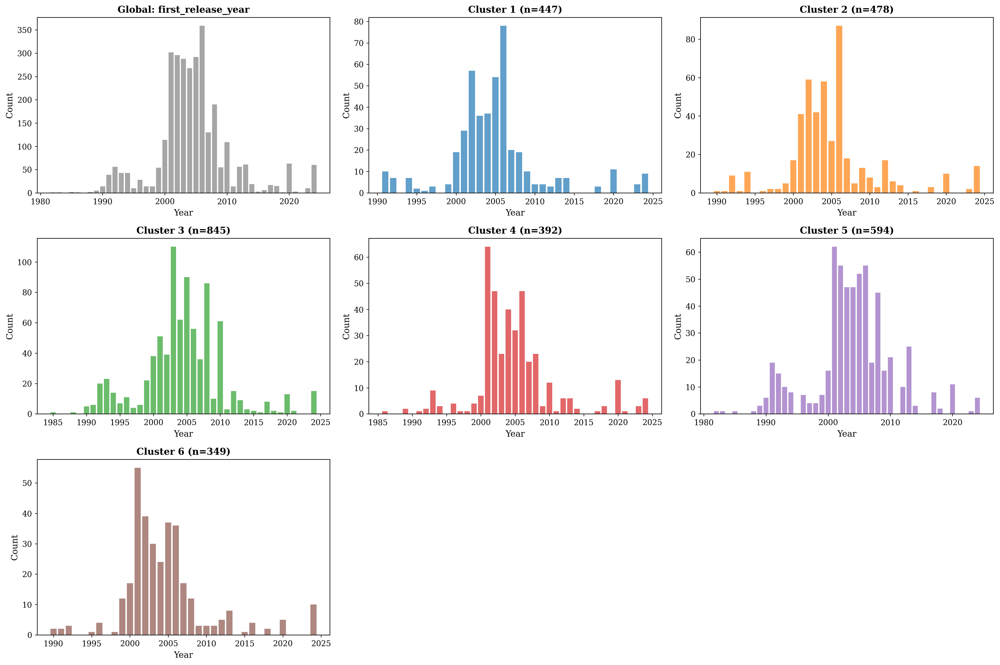


=== involved_companies ===


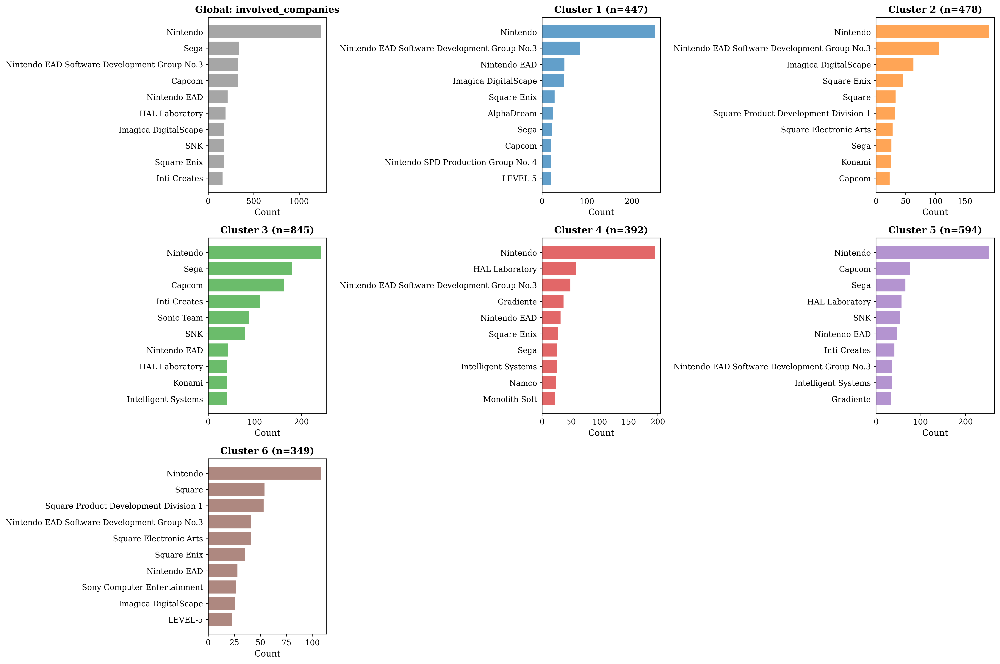


=== keywords ===


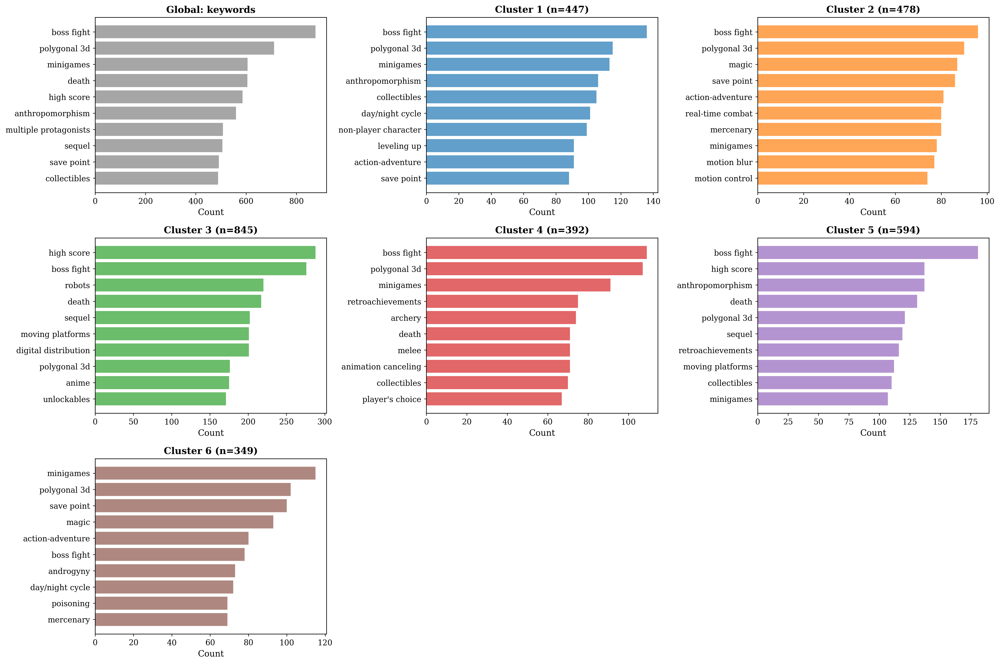


=== name ===


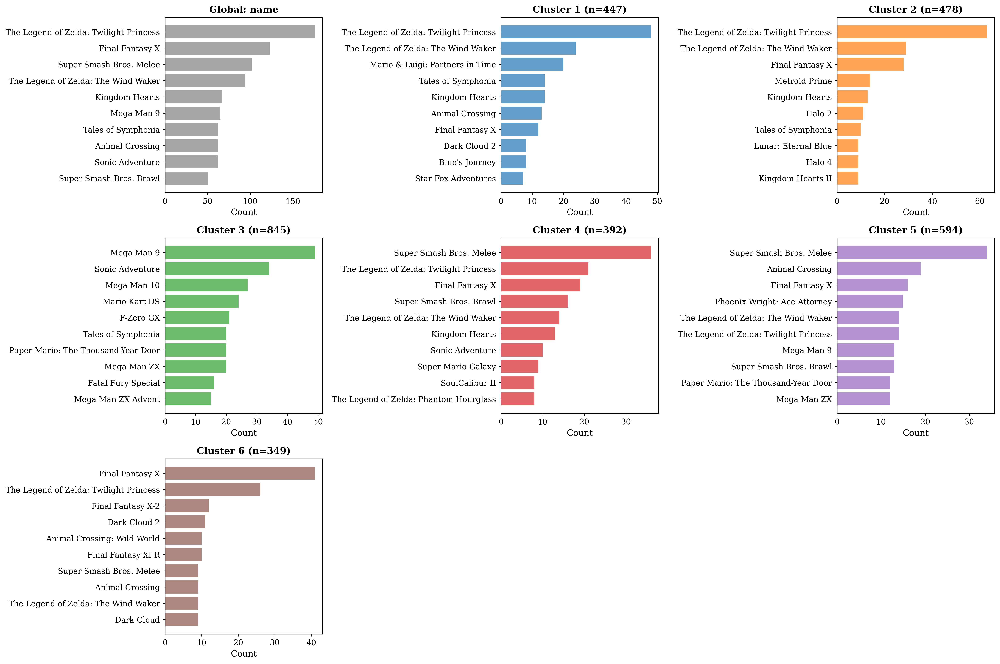


=== themes ===


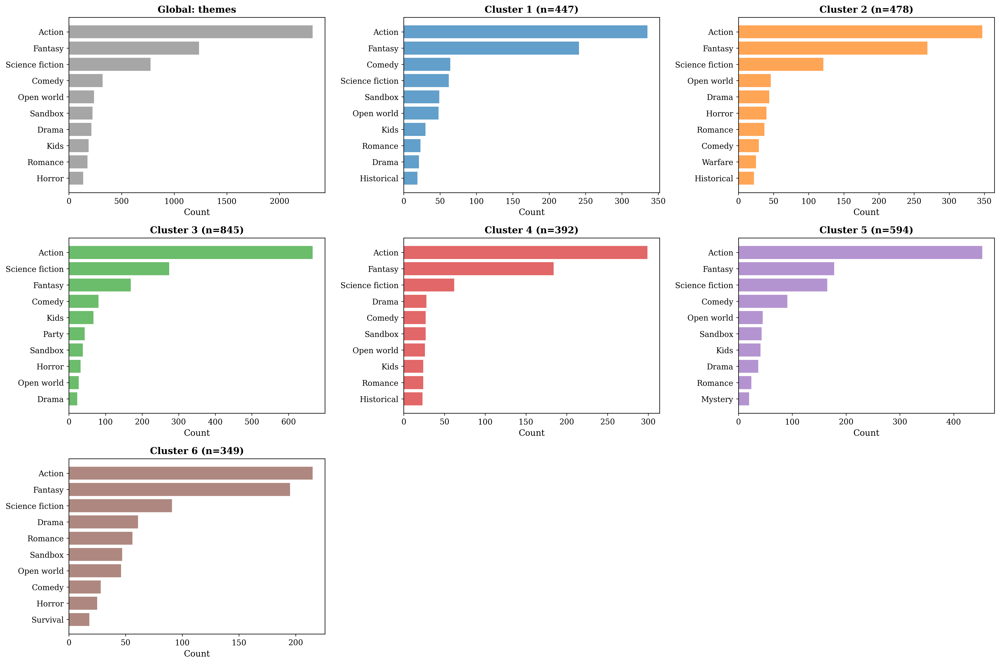


=== Cluster Sizes ===


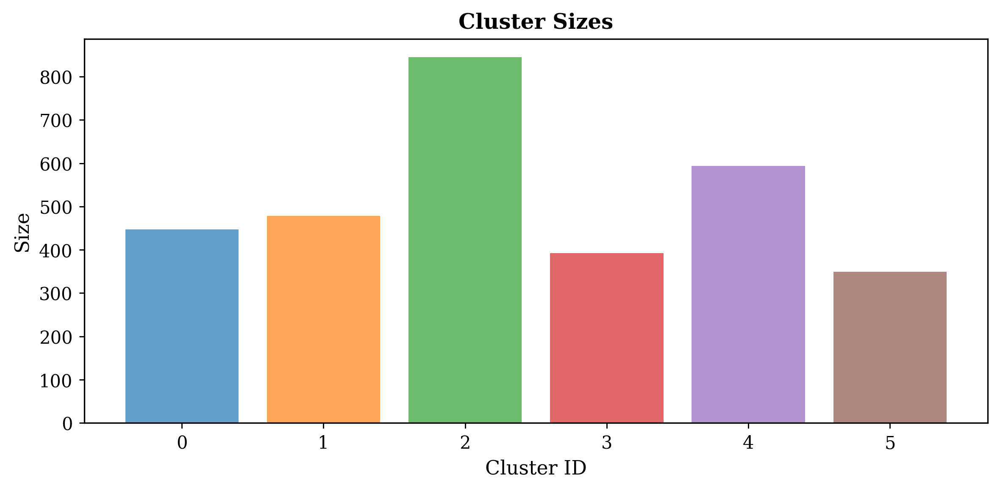

In [19]:

plot_metadata_distributions(column_metrics, top_n=10)